<a href="https://colab.research.google.com/github/harshagangari747/ML-HW/blob/main/Homework_4_Convolutional_Neural_Nets_final_draft.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework 4 CSCI 4364/6364 Machine Learning

##**Convolutional Neural Networks**

**Due Date: 11/12/2024, 23:59 ET**

---

**Purpose:**
The purpose of this homework is to familiarize you with **convolutional neural networks** (CNN). We will be using [histology images](https://en.wikipedia.org/wiki/Histology#:~:text=Histology%2C%20also%20known%20as%20microscopic,structures%20visible%20without%20a%20microscope.) used to classify types of  colorectal cancer. You will start with a simple CNN, called LeNet, and apply several improvements made in the AlexNet architecture. You will also get a peek into the CNN layers and channels and how they respond to individual images. Then, you'll implement the GoogLeNet architecture and make modifications to the Inception blocks.

---
**Important!**

* In this homework, you should use [Dive into Deep Learning (d2l)](https://d2l.ai/) as a reference. You may take code snippets that are for **TensorFlow only** and apply them in this homework assignment.


* The models you are working with in this homework are quite advanced and require some time and CPU/GPU resources to execute. You may consider upgrading to [Colab Pro](https://colab.research.google.com/signup) or the pay-as-you-go subscription if you are running out of memory or if your session disconnects after a while. As you proceed through the assignment, take note of the overall **accuracy**, **runtime**, and the **size** (number of parameters) of your models. Finally, give yourself some time to execute the code in the homework.

---
**Submission Instructions:**
This assignment will be done entirely in this Colaboratory notebook, and you will submit your notebook via GWU blackboard. Please embed your code in code blocks and add in comments into the text blocks.

**Grading on the notebook:**
This notebook is worth up to 5% (with up to 3% additional extra credit) of the semester grade, where 3% is completion and full functionality, and 2% is based on comments and descriptions, and well-written and commented Python code, based on the coding standards. The notebook should be fully explained and work in its entirety when you submit it.

**Coding Standards:**
Throughout this course, we will use [Google’s Python Style Guide](https://google.github.io/styleguide/pyguide.html) as the coding standard for homework and project submission. A big part of machine learning in industry is applying good programming practices.


**Name:** Sai Harsha Gangari

**GW ID:** G38696889

In [1]:
#@title Imports
##########################################################
# Always include all imports at the first executable cell.
##########################################################
import numpy as np
import time
import matplotlib.pyplot as plt
from abc import ABC, abstractmethod # Abstract Base Classes for Python
import matplotlib.image as mpimg
import seaborn as sns; sns.set()

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

from typing import Dict, Optional, Sequence
import tensorflow as tf
from gc import callbacks
import tensorflow_datasets as tfds



#1. Access the colorectal histology dataset

First, download and view the [colorectal histology](https://www.tensorflow.org/datasets/catalog/colorectal_histology)  sample from TFDS, and display the first 9 images and their labels.

Classification of textures in colorectal cancer histology. Each example is a 150 x 150 x 3 RGB image of one of 8 classes.

In this assignment, you'll be working on **TensorFlow datasets**, so you may want to review the [API](https://www.tensorflow.org/api_docs/python/tf/data/Dataset). Specifically, you should review `map()`, `shuffle()`, `batch()`, and `load()`.

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/5000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/colorectal_histology/incomplete.ASZC5Y_2.0.0/colorectal_histology-train.tf…

Dataset colorectal_histology downloaded and prepared to /root/tensorflow_datasets/colorectal_histology/2.0.0. Subsequent calls will reuse this data.
tfds.core.DatasetInfo(
    name='colorectal_histology',
    full_name='colorectal_histology/2.0.0',
    description="""
    Classification of textures in colorectal cancer histology. Each example is a 150 x 150 x 3 RGB image of one of 8 classes.
    """,
    homepage='https://zenodo.org/record/53169#.XGZemKwzbmG',
    data_dir=PosixGPath('/tmp/tmp5sk3_caxtfds'),
    file_format=tfrecord,
    download_size=246.14 MiB,
    dataset_size=179.23 MiB,
    features=FeaturesDict({
        'filename': Text(shape=(), dtype=string),
        'image': Image(shape=(150, 150, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=8),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=5000, num_shards=2>,
    },
    citation="""@article{kather2016mult

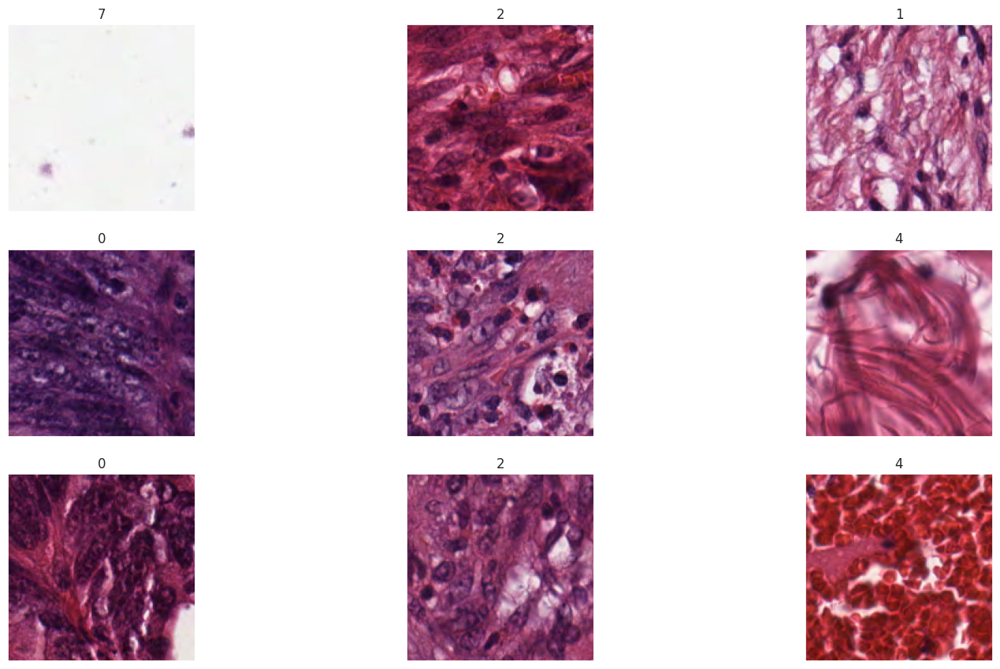

In [2]:
#@title Download the Colorectal Histology image dataset and display examples.

def plot_example(x_raw, y_raw):
  fig, axes = plt.subplots(3, 3)
  i = 0
  for i in range(3):
    for j in range(3):
      imgplot = axes[i,j].imshow(x_raw[i*3 + j], cmap = 'bone')
      axes[i,j].set_title(y_raw[i*3 + j])
      axes[i,j].get_yaxis().set_visible(False)
      axes[i,j].get_xaxis().set_visible(False)
  fig.set_size_inches(18.5, 10.5, forward=True)


## TODO: Implement the split function parameter: 80% train, 10% validation, and 10% test.
(ds_train, ds_val, ds_test), ds_info = tfds.load("colorectal_histology",
                                           split=["train[:80%]", "train[80%:90%]","train[90%:]"],
                                           as_supervised=True, with_info=True)
df = tfds.as_dataframe(ds_train.shuffle(1000).take(1000), ds_info)



plot_example(df['image'], df['label'])
print(ds_info)

#2. Define the base class, and define some mapping utilities for TF datasets.
We're making a slight adjustment to the base learning algorithm to take advantage of the TensorFlow dataset structure, rather than using numpy arrays.

We also need to add a few additional methods that will help display layerwise activations in section 5.


In [3]:
#@title Define a base class class for Learning Algorithm

class BaseLearningAlgorithm(ABC):
  """Base class for a Supervised Learning Algorithm."""

  @abstractmethod
  def fit(self, ds_train: tf.data.Dataset, ds_val: tf.data.Dataset) ->  tf.keras.callbacks.History:
    """Trains the classifier dataset with a train and validation dataset."""

  @abstractmethod
  def predict(self, x_test: tf.data.Dataset) -> np.array:
    """Predicts one or more examples in the dataset.."""

  @property
  @abstractmethod
  def name(self) -> str:
    """Returns the name of the algorithm."""

  @property
  def layers(self) -> Sequence[tf.keras.layers.Layer]:
    """Returns the layers in the model as a list."""
    raise NotImplementedError()

  @property
  def input(self):
    """Returns the activations per layer, used for displaying activations."""
    raise NotImplementedError()



We are also making some small adjustments to `train_eval()` from homework 3. We are still generating the confusion matrix and the classification accuracy tables like in homework 3.

In [4]:
#@title Train Eval
def train_eval(learning_algo: BaseLearningAlgorithm, ds_train: tf.data.Dataset, ds_val: tf.data.Dataset, ds_test: tf.data.Dataset):
  """Trains and evaluates the generic model."""

  learning_algo.fit(ds_train, ds_val)

  test_map = ds_test.map(normalize_image)
  for images, labels in ds_val.batch(10000):
    y_test = labels.numpy()
    y_pred =  learning_algo.predict(images)

  mat = confusion_matrix(y_test, y_pred)
  sns.set(rc = {'figure.figsize':(8,8)})
  sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
              xticklabels=['%d' %i for i in range(8)],
              yticklabels=['%d' %i for i in range(8)])
  plt.xlabel('true label')
  plt.ylabel('predicted label')
  plt.title(learning_algo.name)

  print(classification_report(y_test, y_pred,
                              target_names=['%d' %i for i in range(8)]))


#3. Implement the LeNet architecture as a baseline.


Review [D2L section 6.6](https://classic.d2l.ai/chapter_convolutional-neural-networks/lenet.html)  on the LeNet convolutional neural network. Implement the Tensoflow version of LeNet below. You should include the same TensorFlow architecture and adapt the fit method.


In [5]:
#@title <h3>Defining utility functions</h3>
"""Define the map to category (one hot encoding)
   an normalize (normalizes images)
   methods
 """
def map_to_categorical(image, label):
    return image, tf.one_hot(label, depth=8)

def normalize_image(image, label):
    return tf.cast(image, tf.float32) / 255.,label

Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - accuracy: 0.2401 - loss: 1.8670 - val_accuracy: 0.5800 - val_loss: 1.3668
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - accuracy: 0.3757 - loss: 1.5041 - val_accuracy: 0.4800 - val_loss: 1.2051
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4463 - loss: 1.3545 - val_accuracy: 0.6140 - val_loss: 1.0667
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4906 - loss: 1.2232 - val_accuracy: 0.6640 - val_loss: 0.9705
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.5300 - loss: 1.1738 - val_accuracy: 0.7020 - val_loss: 0.8915
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5764 - loss: 1.0487 - val_accuracy: 0.7280 - val_loss: 0.8168
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6160 - loss: 0.9616 - val_accuracy: 0.7140 - val_loss: 0.7849
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6443 - loss: 0.9319 - val_accuracy: 0.7260 - 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        45
           1       0.37      0.32      0.34        69
           2       0.00      0.00      0.00        69
           3       1.00      0.41      0.58        63
           4       0.19      0.84      0.30        58
           5       0.33      0.01      0.03        68
           6       0.82      0.74      0.78        61
           7       0.81      1.00      0.89        67

    accuracy                           0.42       500
   macro avg       0.44      0.42      0.37       500
weighted avg       0.45      0.42      0.37       500

CPU times: user 1min 14s, sys: 7.17 s, total: 1min 21s
Wall time: 1min 15s
1088016


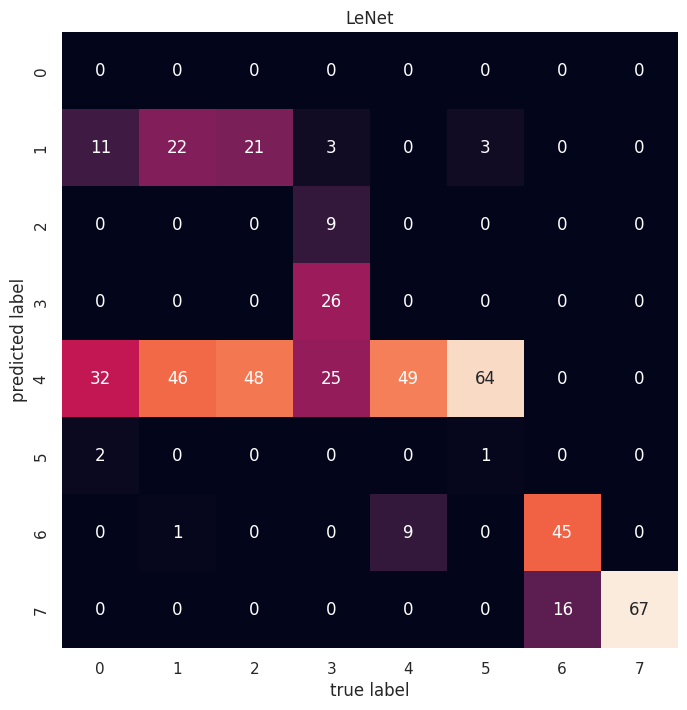

In [ ]:
#@title LeNet Classifier
"""
This class defines a LeNet classifier.
Modifications done:
1. Added relu activation function instead of sigmoid
2. Removed one of the dropout layer
3. Added dropout layer before final layer with 0.3 probability
4. Changed filter, kernel sizes
5. Changed the second AveragePool2D to MaxPool2D
"""
class LeNet(BaseLearningAlgorithm):
  #TODO: Implement the LetNet architecture as an extension class of BaseLearningAlgorithm.

  # --> Architecture is same as of in D2L sec 6.6.
  # --> Modified the architecture to use 'relu' activation function at all layers
  # --> Ouput layer is adjusted to 8 nodes with softmax activation function
  def __init__(self ):
    self._model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(filters=6, kernel_size=5, activation='relu',
                               padding='same'),
        tf.keras.layers.AvgPool2D(pool_size=5, strides=3),

        tf.keras.layers.Conv2D(filters=32, kernel_size=3,
                               activation='relu',padding='same'),
        tf.keras.layers.MaxPool2D(pool_size=4, strides=2),

        tf.keras.layers.Flatten(),

        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(8,activation='softmax')])

    self._num_epochs = 50 # defines no of epochs used
    self.optimizer = tf.keras.optimizers.Adam(learning_rate=0.00033) # defines optimizer with 0.001 learning rate


  def fit(self, ds_train: tf.data.Dataset, ds_val: tf.data.Dataset) ->  tf.keras.callbacks.History:
    """Trains a model using a train and validation dataset."""

    # TODO create train_batches and val_batches using datset.shuffle(), .batch(), and .map() map_to_categorical, and normalize_image.
    # --> shuffles, maps to categorical values, normalizes the images and then batches the dataset as 64 each
    # --> for both training and validation dataset
    train_batches= ds_train.shuffle(buffer_size=10000).map(map_to_categorical).map(normalize_image).batch(64)
    val_batches= ds_val.shuffle(buffer_size=10000).map(map_to_categorical).map(normalize_image).batch(64)

    # --> compile the model with appropriate optimizer, loss function and 'accuracy' as metrics
    self._model.compile(optimizer=self.optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    # --> run the fit method on the model
    history = self._model.fit(train_batches, epochs=self._num_epochs, validation_data = val_batches)

  def predict(self, x_test:tf.Tensor) :
    """Predicts on an unlabeled sample, X."""
    return np.argmax(self._model.predict(x_test), axis = 1)

  @property
  def name(self) -> str:
    """Returns the name of the algorithm."""
    return "LeNet"

  @property
  def layers(self) -> Sequence[tf.keras.layers.Layer]:
    """Returns the layers in the model as a list."""
    return self._model.layers

  @property
  def input(self):
    """Returns the input at a layer activations per layer."""
    return self._model.input

# --> Create the LeNet() instance
lenet = LeNet()
%time train_eval(lenet, ds_train, ds_val, ds_test)
print(lenet._model.count_params())

In [ ]:
#@title <h3>Print total number of parameters in LeNet Model</h3>
lenet._model.count_params()

1088016

##Question 3.1 LeNet performance
(a) What was the overall accuracy and runtime achieved by LeNet?

* Answer: When ran on **T4 GPU**, the overall accuracy is recorded as: **42%** . The runtime duration is : **1min 21 secs**. The lenet model was modified to accomodate better accuracy than the original model that was defined in the d2l.ai section 6.6. I changed the activation functions, filters, kernel sizes, Pooling layer type in the original model.

(b) Describe which classes generate the most errors based on the confusion matrix.

* Class **4,1** tend to be misclassified more than any other classes

(c) What was the execution runtime?

* The execution runtime is : **1 mins 14secs**

(d) How many parameters does the model have?

* The total number of parameters in above LeNet model is : **1088016**

#4. Enhance the baseline LeNet Architecture

Next, review [D2L section 7.1](https://classic.d2l.ai/chapter_convolutional-modern/index.html) and  the improvements the AlexNet made to the LeNet architecture. Similarly, design and implement an architecture with different layers, activation functions, channel counts, filter sizes, and optimizers, learning rates, batch size, and epochs. You should keep the same cetgorical cross-entropy loss, however. Your architecture should yield better accuracy than the LeNet baseline.

Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 22s 179ms/step - accuracy: 0.2580 - loss: 1.8449 - val_accuracy: 0.6740 - val_loss: 1.1099
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step - accuracy: 0.5070 - loss: 1.1945 - val_accuracy: 0.6380 - val_loss: 0.9215
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - accuracy: 0.5625 - loss: 1.0446 - val_accuracy: 0.6980 - val_loss: 0.8036
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - accuracy: 0.6371 - loss: 0.9045 - val_accuracy: 0.7200 - val_loss: 0.7198
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - accuracy: 0.6802 - loss: 0.8157 - val_accuracy: 0.7460 - val_loss: 0.6998
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - accuracy: 0.6926 - loss: 0.7821 - val_accuracy: 0.7440 - val_loss: 0.6630
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - accuracy: 0.7197 - loss: 0.7290 - val_accuracy: 0.7680 - val_loss: 0.5857
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - accuracy: 0.7524 - loss: 0.6597 - val_accuracy

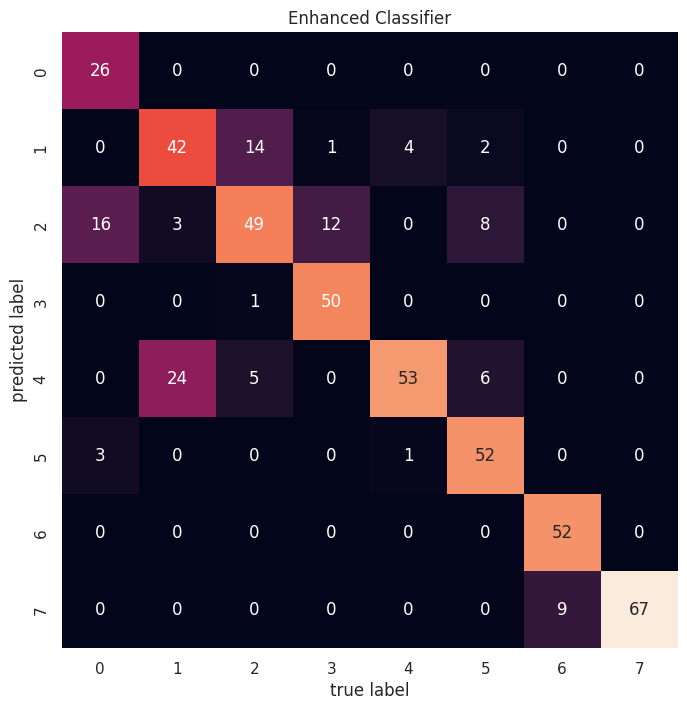

In [ ]:
#@title Enhanced LeNet Architecture
# TODO: Implement the enhanced classifier applying some of the ideas of AlexNet.
# You can can make EnhancedClassifier a subclass of BaseLearningAlgorithm or LeNet.
"""
This class defines AlexNet Model but with some enhancements.
Modifications done:
1. Changed all filter, kernel, pooling,
   stride and dropout probability values
"""
import tensorflow as tf

class EnhancedClassifier(BaseLearningAlgorithm):
    def __init__(self):
      self._model =tf.keras.models.Sequential([

      tf.keras.layers.Conv2D(filters=50, kernel_size=10, padding='same',
                               activation='relu'),
      tf.keras.layers.MaxPool2D(pool_size=3, strides=3),


      tf.keras.layers.Conv2D(filters=75, kernel_size=5, padding='same',
                               activation='relu'),
      tf.keras.layers.MaxPool2D(pool_size=3, strides=2),

        # Use three successive convolutional layers
      tf.keras.layers.Conv2D(filters=100, kernel_size=3, padding='same',
                               activation='relu'),
      tf.keras.layers.Conv2D(filters=150, kernel_size=3, padding='same',
                               activation='relu'),
      tf.keras.layers.Conv2D(filters=150, kernel_size=2, padding='same',
                               activation='relu'),
      tf.keras.layers.MaxPool2D(pool_size=2, strides=1),
      tf.keras.layers.Flatten(),

      tf.keras.layers.Dense(1000, activation='relu'),
      tf.keras.layers.Dropout(0.1),
      tf.keras.layers.Dense(500, activation='relu'),
      tf.keras.layers.Dropout(0.3),
      tf.keras.layers.Dense(100, activation='relu'),

      tf.keras.layers.Dense(8,activation='softmax')])
      self._num_epochs = 50
      self.optimizer = tf.keras.optimizers.Adam(learning_rate=0.000025)
      self.batch_size = 64


    """Train the model"""
    def fit(self, ds_train, ds_val):

        self._model.compile(optimizer=self.optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

        train_batches = ds_train.shuffle(10000).map(map_to_categorical).map(normalize_image).batch(self.batch_size)
        val_batches = ds_val.shuffle(10000).map(map_to_categorical).map(normalize_image).batch(self.batch_size)

        history = self._model.fit(train_batches, epochs=self._num_epochs, validation_data=val_batches)

    """Predict the output"""
    def predict(self, x_test)->np.array:
        return np.argmax(self._model.predict(x_test), axis=1)

    @property
    def name(self):
        return "Enhanced Classifier"

    @property
    def layers(self):
        return self._model.layers

enhanced_classifier = EnhancedClassifier()
%time train_eval(enhanced_classifier, ds_train, ds_val, ds_test)


In [ ]:
#@title <h3>Print the number of parameters in Enhanced Classifier Model</h3>
enhanced_classifier._model.count_params()

80304183

##Question 4.1 Enhanced Classifier performance
(a) What was the overall accuracy and runtime achieved by your enhanced architecture inspired by AlexNet?

* Answer: The overall accuracy recorded for AlexNet (enhanced architecture) is: **78%** when run for 50 epochs.

(b) Describe which classes generate the most errors based on the confusion matrix.
* Answer: The classes, when sorted in desceding order, **4,2** generate most errors/misclassifications

(c) What was the execution runtime?
* When ran on **T4 GPU**, The total execution time is: **6min 14secs**.

(d) How many parameters does your model have?

* My model has **80304183** parameters

##[OPTIONAL 2% grade points] Early Stopping

Create a keras callback function with early stopping instead of specifying the number of epochs, allowing the model to train until the patience parameter runs out.

Question: How many epochs did your model execute before early stopping quit?

* Answer: When ran for **50 epochs as target** , the model with early stopping ran for **26 epochs** before quitting.

Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - accuracy: 0.2105 - loss: 1.9837 - val_accuracy: 0.3640 - val_loss: 1.3207
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4145 - loss: 1.3871 - val_accuracy: 0.5800 - val_loss: 1.0502
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.4650 - loss: 1.1939 - val_accuracy: 0.3880 - val_loss: 1.2071
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4443 - loss: 1.2245 - val_accuracy: 0.5580 - val_loss: 0.9509
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5506 - loss: 1.0199 - val_accuracy: 0.5740 - val_loss: 0.9147
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5395 - loss: 1.0393 - val_accuracy: 0.5840 - val_loss: 0.9291
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5503 - loss: 1.0144 - val_accuracy: 0.6360 - val_loss: 0.9114
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5811 - loss: 0.9640 - val_accuracy: 0.6180 - 

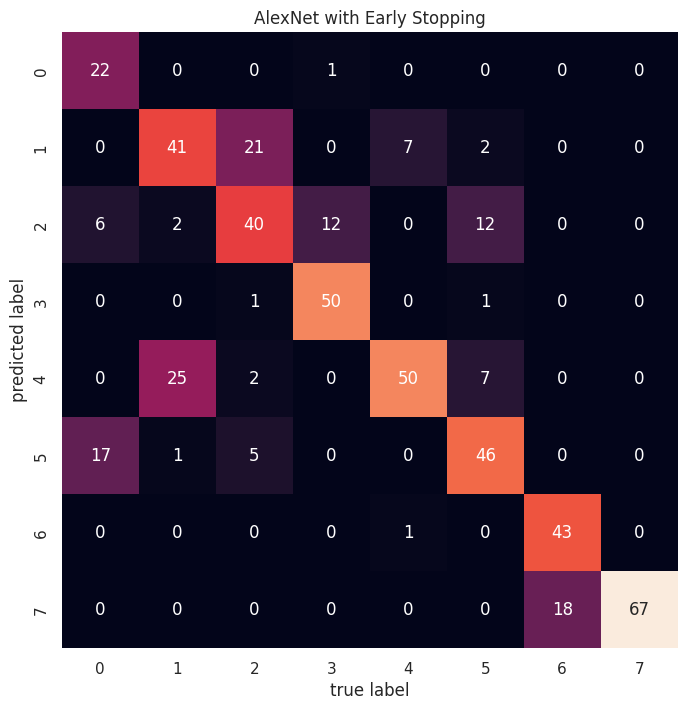

In [ ]:
#@title <font size="3"><b> Early stopping implementation</b></font>
"""
This class defines AlexNet (Enhanced Classifier) with early stopping mechanism
"""
class AlexNetAlgorithmWithEarlyStopping(EnhancedClassifier):
  def __init__(self):
    super().__init__()
    self._num_epochs = 50
    self.early_stopping = tf.keras.callbacks.EarlyStopping(patience=4, restore_best_weights=True)

  def fit(self, ds_train, ds_val) -> tf.keras.callbacks.History:
    train_batches = ds_train.shuffle(10000).map(map_to_categorical).map(normalize_image).batch(self.batch_size)
    val_batches = ds_val.shuffle(10000).map(map_to_categorical).map(normalize_image).batch(self.batch_size)

    self._model.compile(optimizer=self.optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    history = self._model.fit(train_batches, epochs=self._num_epochs, validation_data=val_batches, callbacks=[self.early_stopping])


  def predict(self, x_test) -> np.array:
    return super().predict(x_test)

  @property
  def name(self) -> str:
    """Returns the name of the algorithm."""
    return "AlexNet with Early Stopping"

  @property
  def layers(self) -> Sequence[tf.keras.layers.Layer]:
    """Returns the layers in the model as a list."""
    return self._model.layers

  @property
  def input(self):
    """Returns the input at a layer activations per layer."""
    return self._model.input

alexNetWithEarlyStopping = AlexNetAlgorithmWithEarlyStopping()
%time train_eval(alexNetWithEarlyStopping, ds_train, ds_val, ds_test)

##[OPTIONAL 1% grade point] Learning rate scheduler

Add in a decaying learning [rate scheduler](https://keras.io/api/optimizers/) to the optimizer, replacing the fixed-rate schedule.

What learninging rate decay did you apply?
* I have applied **Polynomial learning rate decay**, starting from 0.001 to end at 0.00005.

What were the parameters?
* The parameters for the PolynomialDecay learning rate function are initial learning rate, steps to decay, target learning rate, cycle: where the learning rate should repeat, and degree polynomial i.e. power

Were there there any performance improvements?
* I didn't see any performance improvements when compared to early stopping or enhanced classifier without any callbacks. May be if I use exponential decay or adjust learning rates more preciesely, I could have got better performance.


Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.2122 - loss: 1.8369 - val_accuracy: 0.5220 - val_loss: 1.3685
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.3802 - loss: 1.4367 - val_accuracy: 0.5020 - val_loss: 1.3320
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4072 - loss: 1.4179 - val_accuracy: 0.5380 - val_loss: 1.3005
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.4073 - loss: 1.3985 - val_accuracy: 0.5320 - val_loss: 1.2742
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4339 - loss: 1.3575 - val_accuracy: 0.4300 - val_loss: 1.2569
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.4337 - loss: 1.3396 - val_accuracy: 0.5600 - val_loss: 1.2192
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4360 - loss: 1.3440 - val_accuracy: 0.5400 - val_loss: 1.1832
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4509 - loss: 1.3057 - val_accuracy: 0.5680 - 

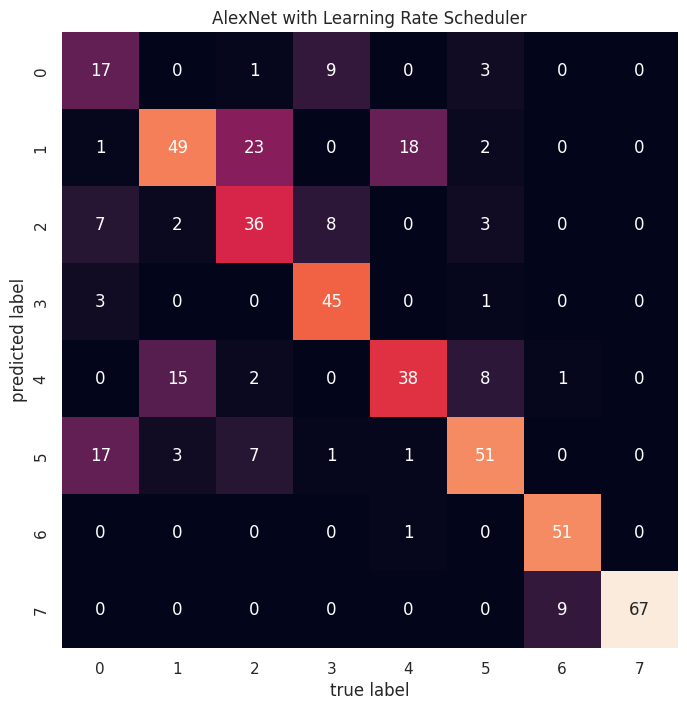

In [ ]:
#@title <h3> Enhanced Classifier with Learning rate scheduler - Polynomial Decay </h3>
"""
This class defines AlexNet Model with Learning Rate Scheduler
Use PolynomialDecay learning rate scheduler
"""
class AlexNetWithLearningRateScheduler(EnhancedClassifier):
  def __init__(self):
    super().__init__()
    self._num_epochs = 50
    self.learning_rate = 0.00025

    self.learning_rate_scheduler = tf.keras.optimizers.schedules.PolynomialDecay(
        initial_learning_rate=self.learning_rate,
        decay_steps=self._num_epochs,
        end_learning_rate=0.000005,
        cycle=False,
        power=1.0
    )

    self.optimizer = tf.keras.optimizers.Adam(learning_rate=self.learning_rate_scheduler)

  def scheduler(self,epoch,currLearningRate):
    print('current epoch', epoch)
    if epoch < 20:
        return currLearningRate
    elif epoch>=20:
        return currLearningRate * ((1-(epoch/self._num_epochs))**2)

  def fit(self, ds_train, ds_val) -> tf.keras.callbacks.History:
    train_batches = ds_train.shuffle(10000).map(map_to_categorical).map(normalize_image).batch(self.batch_size)
    val_batches = ds_val.shuffle(10000).map(map_to_categorical).map(normalize_image).batch(self.batch_size)

    self._model.compile(optimizer=self.optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    history = self._model.fit(train_batches, epochs=self._num_epochs, validation_data=val_batches)

  def predict(self, x_test) -> np.array:
    return super().predict(x_test)

  @property
  def name(self) -> str:
    """Returns the name of the algorithm."""
    return "AlexNet with Learning Rate Scheduler"
  @property
  def layers(self) -> Sequence[tf.keras.layers.Layer]:
    """Returns the layers in the model as a list."""
    return self._model.layers

  @property
  def input(self):
    """Returns the input at a layer activations per layer."""
    return self._model.input

alexNetWithLearningRateScheduler = AlexNetWithLearningRateScheduler()
%time train_eval(alexNetWithLearningRateScheduler, ds_train, ds_val, ds_test)

In [ ]:
#@title <h3>Printing Enhanced Classifier paramters</h3>
print(enhanced_classifier._model.count_params())

2675458


#5. Investigate the activations of the each layer and channel.

In this section. we'll explore the activations at each layer in your enhanced CNN by plotting them and inspecting the activation images for example images, layers, and channels.

We'll create a series of images that are grouped by layer, channel, and image. Recall that a layer usually has multiple channels, and each channel projects an output image for an input image.

Use the function `plot_activations()` to generate multiple activation plots. Note that before each new layer, the function shows the raw input image to make the visual inspection a little easier.

In [ ]:
def plot_activations(learning_algo: BaseLearningAlgorithm, num_examples: int, num_layers: int, ds_test: tf.data.Dataset) -> None:
  """Plots activations for convolutional layers.

  Args:
    learning_algo: an implementaion of the BaseLearningAlgorithm
    num_examples: number of example images randomly selected from the dataset
    num_layers: The number of layers to investigate, stari

  """

  layer_outputs = [layer.output for layer in learning_algo.layers[:num_layers]]
  activation_model = tf.keras.models.Model(inputs=enhanced_classifier._model.layers[0].input, outputs=layer_outputs)

  ds_test_normalized = ds_test.map(normalize_image)

  # Get the activations for the example images.
  for image, label in ds_test_normalized.shuffle(1000).batch(num_examples).take(1):
    activations  = activation_model.predict(image)

  for i in range(num_layers):
    activation_layer = activations[i]
    (num_images, _, _, num_channels) = activations[i].shape

    fig, axs = plt.subplots(nrows=num_channels + 1, ncols=num_examples, figsize=(10 * num_examples, 10 * (num_channels + 1)))

    for k in range(len(image)):
      axs[0,k].set_title("Input Image for class %d" %label[k])
      axs[0,k].imshow(image[k], cmap = 'bone')

    for j in range(num_channels):
      for k in range(num_examples):

        axs[j+1,k].set_title("layer %d channel %d, example %d" %(i, j, k))
        axs[j+1,k].matshow(activation_layer[k, :, :, j], cmap='bone')

#alexNetAlgorithm = enhanced_classifier
plot_activations(enhanced_classifier, num_examples = 5, num_layers = 5, ds_test = ds_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 707ms/step
Error in callback <function _draw_all_if_interactive at 0x7d9b8d7524d0> (for post_execute):


ValueError: Image size of 5000x76000 pixels is too large. It must be less than 2^16 in each direction.

ValueError: Image size of 5000x76000 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 5000x76000 with 380 Axes>

ValueError: Image size of 5000x76000 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 5000x76000 with 380 Axes>

ValueError: Image size of 5000x101000 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 5000x101000 with 505 Axes>

##Question 5.1 What do the activations tell us about our network?

(a) For a given layer, describe why some activation channels (rows) tend to have stronger responses than other channels. (The strength of a response is visualized by the brightness of the image). Can you describe the textures that a channel is sensitive to? Do any channels have no activation response (all black images)? If so, why?

**Answer:**
* The channel which shows strong response tend to contain the key details that are necessary to determine the output. I feel the details are spread out into different channels, where few channels contribute strongly for a feature and few channels contribute less to a particular feature. More key details about a feature the more bright spots appears in the activation channel plot.

* Secondly, I observed that the purple spot (or the dark black spots) texture in the image influence the channels because the corresponding regions in the activation channels have bright spots.

* Few channels have black region or no bright spots. This is due to the same reason that these channels doesn't contain enough details about a feature. Speaking of the similar analogy, if we want to find that an image contains a chocolate,which is brown in color, by seeing the color (red + green), different channels contains red and green details and few channels contains blue details. To determine a chocolate, we doesn't need blue color. The channels that contains blue details are likely to give black regions. Same with the current dataset images.

**------**

(b) Describe some differences in the layers. Why are the images getting smaller as the layers increase? What is the relationship between the layer and a receptive field? Why do the images have larger pixels at the higher levels making the image look more "pixelated"?

**Answer:**
* As the layers increase, the CNN kind of zooms into the input image. It means that the area where it focus is more pronounced and small. More over the information is pooled by maximum or averaged from previous layers. This makes the network learn more important features keeping aside less important features. So, there is a slight information loss per each layer, from which the differences in images across arises.

* The relationship between receptive field and layers is as the layers increases the receptive field increases as the image in zoomed-in in further deeper layers.

* The obvious reason is that the receptive field is much higher concentrating on the minute details in a very small region of the image. Thus the image becomes more pixelated as we move deeper into the layers.

**------**

(c) Compare the activations between channels at a layer. Do the channels detect the same textures or do they detect different textures? What enables channels at the same layer to detect different textures?

**Answer:**
* The different channels at the same layer tends to capture different textures when observed in the above activation channel plots.
* This is because the input image is defined across the different channels differently. It's like each channel corresponds to unique filter capturing unique details of the image. Thus, we see the different textures on different channels.



#6. Implement GoogLeNet Inception Architecture.

Review section [D2L Section 7.4](https://classic.d2l.ai/chapter_convolutional-modern/googlenet.html) and implement a GoogLeNet architecture with Inception blocks. Start with the origina architecture, and then make alterations that improve performance. These alterations may include adding more or fewer layers, activation functions, changing parameter number of channels, pooling sizes, etc.)

In [6]:
#@title Defining Inception block
"""
This cell defines the Inception block (taken from d2l.ai book)
"""
class Inception(tf.keras.Model):
  def __init__(self, c1, c2, c3, c4):
    super().__init__()
    self.p1_1 = tf.keras.layers.Conv2D(c1, 1, activation='relu')
        # Path 2 is a 1 x 1 convolutional layer followed by a 3 x 3
        # convolutional layer
    self.p2_1 = tf.keras.layers.Conv2D(c2[0], 1, activation='relu')
    self.p2_2 = tf.keras.layers.Conv2D(c2[1], 3, padding='same',
                                           activation='relu')
        # Path 3 is a 1 x 1 convolutional layer followed by a 5 x 5
        # convolutional layer
    self.p3_1 = tf.keras.layers.Conv2D(c3[0], 1, activation='relu')
    self.p3_2 = tf.keras.layers.Conv2D(c3[1], 5, padding='same',
                                           activation='relu')
        # Path 4 is a 3 x 3 maximum pooling layer followed by a 1 x 1
        # convolutional layer
    self.p4_1 = tf.keras.layers.MaxPool2D(3, 1, padding='same')
    self.p4_2 = tf.keras.layers.Conv2D(c4, 1, activation='relu')

  def call(self, x):
    p1 = self.p1_1(x)
    p2 = self.p2_2(self.p2_1(x))
    p3 = self.p3_2(self.p3_1(x))
    p4 = self.p4_2(self.p4_1(x))
        # Concatenate the outputs on the channel dimension
    return tf.keras.layers.Concatenate()([p1, p2, p3, p4])

Epoch 1/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 60s 555ms/step - accuracy: 0.1272 - loss: 2.0672 - val_accuracy: 0.2020 - val_loss: 1.8600
Epoch 2/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 11s 165ms/step - accuracy: 0.2884 - loss: 1.6672 - val_accuracy: 0.4260 - val_loss: 1.3186
Epoch 3/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 167ms/step - accuracy: 0.4625 - loss: 1.3088 - val_accuracy: 0.5900 - val_loss: 1.1588
Epoch 4/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 11s 172ms/step - accuracy: 0.5509 - loss: 1.1544 - val_accuracy: 0.6040 - val_loss: 1.0060
Epoch 5/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 11s 174ms/step - accuracy: 0.5925 - loss: 1.0538 - val_accuracy: 0.6620 - val_loss: 0.8803
Epoch 6/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 11s 175ms/step - accuracy: 0.6495 - loss: 0.9211 - val_accuracy: 0.6780 - val_loss: 0.8222
Epoch 7/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 172ms/step - accuracy: 0.6800 - loss: 0.8568 - val_accuracy: 0.6880 - val_loss: 0.7935
Epoch 8/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 174ms/step - accuracy: 0.6866 - loss: 0.8260 - val_accu

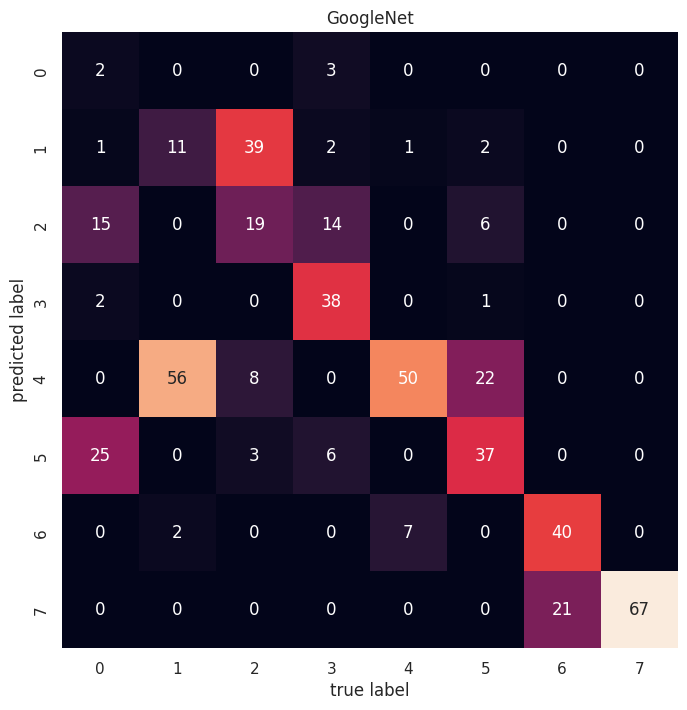

In [ ]:
#@title <h3>GoogleNet Original Architecture(taken from d2l.ai) </h3>

# TODO implement GoogLeNet as a subclass of BaseLearningAlgorithm.


class GoogleNetAlgorithm(BaseLearningAlgorithm):

  def __init__(self):
    self._no_of_epochs = 20
    self._model = tf.keras.Sequential([self.b1(),self.b2(),self.b3(),self.b4(),self.b5(),tf.keras.layers.Dense(8,activation='softmax')])
    return None

  def fit(self, ds_train: tf.data.Dataset, ds_val: tf.data.Dataset) ->  tf.keras.callbacks.History:
    """Trains a model using a train and validation dataset."""
    train_batches = ds_train.shuffle(buffer_size=10000).map(normalize_image).map(map_to_categorical).batch(batch_size=64)
    val_batches = ds_val.shuffle(buffer_size=10000).map(normalize_image).map(map_to_categorical).batch(batch_size=64)

    """
    Learning rate is highly influencing the model's accuracy
    """
    self._model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00002), loss='categorical_crossentropy', metrics=['accuracy'])
    history = self._model.fit(train_batches, epochs=self._no_of_epochs,validation_data=val_batches)
    return history

  def predict(self, x_test:tf.Tensor):
    """Predicts on an unlabeled sample, X."""
    return np.argmax(self._model.predict(x_test), axis=1)

  """
  Added one more inception layer and Average Pooling to the original model
  """
  def b1(self):
    return tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(64, 7, strides=2, padding='same',
                               activation='relu'),
        tf.keras.layers.MaxPool2D(pool_size=3, strides=2, padding='same'),
        Inception(64, (96, 128), (16, 32), 32),
        tf.keras.layers.AvgPool2D(pool_size=3,strides=1,padding='same')])

  """
  Added one more inception layer to the original model
  """
  def b2(self):
    return tf.keras.Sequential([
        tf.keras.layers.Conv2D(64, 1, activation='relu'),
        tf.keras.layers.Conv2D(192, 3, padding='same', activation='relu'),
        Inception(192, (96, 208), (16, 48), 64),
        tf.keras.layers.MaxPool2D(pool_size=3, strides=2, padding='same')])

  def b3(self):
    return tf.keras.models.Sequential([
        Inception(64, (96, 128), (16, 32), 32),
        Inception(128, (128, 192), (32, 96), 64),
        tf.keras.layers.MaxPool2D(pool_size=3, strides=2, padding='same')])

  """
  Removed 2 inception layers from original model
  """
  def b4(self):
    return tf.keras.Sequential([
        Inception(192, (96, 208), (16, 48), 64),
        Inception(128, (128, 256), (24, 64), 64),
        Inception(112, (144, 288), (32, 64), 64),
        tf.keras.layers.MaxPool2D(pool_size=3, strides=2, padding='same')])

  """
  Remove the inception layer in the final block
  """
  def b5(self):
    return tf.keras.Sequential([
        Inception(256, (160, 320), (32, 128), 128),
        tf.keras.layers.GlobalAvgPool2D(),
        tf.keras.layers.Flatten()
    ])


  @property
  def name(self) -> str:
    """Returns the name of the algorithm."""
    return "GoogleNet"

googleNet = GoogleNetAlgorithm()
%time train_eval(googleNet, ds_train, ds_val, ds_test)

In [ ]:
#@title <h3>Print the number of parameters in GoogleNet Model</h3>
print(googleNet._model.count_params())

3529632


##[OPTIONAL 2% grade points] Adapting the GoogLeNet Architecture

Make a changes to  the original GoogLeNet architecture, such as the number of layers or types of layers that yields a consistent improvement in accuracy. (Not looking for a robust statistical test, just consistent improvement over two or more executions). To gain credit, you must describe your design change and demonstrate improved accuracy over two or more executions.

In [ ]:
#@title <h3>GoogleNet Altered(taken from d2l.ai) </h3>


"""
This class defines the Modified Inception block (taken from d2l.ai book)
"""

class GoogleNetAlgorithmAltered(BaseLearningAlgorithm):

  def __init__(self):
    self._no_of_epochs = 10
    self._model = tf.keras.Sequential([self.b1(),self.b2(),self.b3(),self.b4(),self.b5(),tf.keras.layers.Dense(8,activation='softmax')])
    return None

  def fit(self, ds_train: tf.data.Dataset, ds_val: tf.data.Dataset) ->  tf.keras.callbacks.History:
    """Trains a model using a train and validation dataset."""
    train_batches = ds_train.shuffle(buffer_size=10000).map(normalize_image).map(map_to_categorical).batch(batch_size=64)
    val_batches = ds_val.shuffle(buffer_size=10000).map(normalize_image).map(map_to_categorical).batch(batch_size=64)

    """
    Learning rate is highly influencing the model's accuracy
    """
    self._model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00002), loss='categorical_crossentropy', metrics=['accuracy'])
    history = self._model.fit(train_batches, epochs=self._no_of_epochs,validation_data=val_batches)
    return history

  def predict(self, x_test:tf.Tensor):
    """Predicts on an unlabeled sample, X."""
    return np.argmax(self._model.predict(x_test), axis=1)

  def b1(self):
    return tf.keras.models.Sequential([
        Inception(64, (96, 128), (16, 32), 32),
        tf.keras.layers.Conv2D(64, 7, strides=2, padding='same',
                               activation='relu'),
        tf.keras.layers.MaxPool2D(pool_size=3, strides=2, padding='same'),
        Inception(64, (96, 128), (16, 32), 32),
        tf.keras.layers.AvgPool2D(pool_size=3,strides=1,padding='same'),
        tf.keras.layers.Conv2D(56, 3, strides=2, padding='same',
                               activation='relu'),
        tf.keras.layers.MaxPool2D(pool_size=3, strides=1, padding='same')])

  def b2(self):
    return tf.keras.Sequential([
        tf.keras.layers.Conv2D(64, 1, activation='relu'),
        tf.keras.layers.MaxPool2D(pool_size=4, strides=1, padding='same'),

        tf.keras.layers.Conv2D(192, 3, padding='same', activation='relu'),
        Inception(192, (96, 208), (16, 48), 64),
        tf.keras.layers.AvgPool2D(pool_size=3, strides=2, padding='same')])

  def b3(self):
    return tf.keras.models.Sequential([
        Inception(64, (96, 128), (16, 32), 32),
        tf.keras.layers.MaxPool2D(pool_size=3, strides=2, padding='same'),
        tf.keras.layers.Conv2D(64, 1, activation='relu'),
        tf.keras.layers.AvgPool2D(pool_size=3, strides=1, padding='valid'),
        ])

  """Removed 2 inception layers from original model"""
  def b4(self):
    return tf.keras.Sequential([
        Inception(112, (144, 288), (32, 64), 64),
        tf.keras.layers.MaxPool2D(pool_size=3, strides=2, padding='same')])

  def b5(self):
    return tf.keras.Sequential([
        Inception(256, (160, 320), (32, 128), 128),
        tf.keras.layers.GlobalAvgPool2D(),
        tf.keras.layers.Flatten()
    ])


  @property
  def name(self) -> str:
    """Returns the name of the algorithm."""
    return "GoogleNet"

googleNetModifiedAltered = GoogleNetAlgorithmAltered()
%time train_eval(googleNetModifiedAltered, ds_train, ds_val, ds_test)

##Question 6.1 GoogLeNet performance
(a) What was the overall accuracy and runtime achieved by your implementation of GoogLeNet?
* The overall accuracy I got for GoogleNet is **53%** after modifications made to the architecture

(b) Describe which classes generate the most errors based on the confusion matrix.
* Classes **4,5,2** generate most number of misclassifications

(c) What was the execution runtime?
* The code ran for **4min 41secs** for 20 epochs

(d) How many parameters does your model have?
* The GoogleNet model has **3529632 parameters**

#7. Homework Summary



##Question 7.1 Summary

(a) Create a table of the methods you tried (LeNet, Enhanced Classifier, and GoogLeNet) with the overall accuracies. Which method provided the highest accuracy?
* Answer:
<div align="center" style="font-size: 14px">
<table >
<tr>
  <th>Model</th>
  <th>Accuracy</th>
  <th>Epochs</th>
</tr>
<tr>
  <td>LeNet - Modified</td>
  <td>42%</td>
  <td>50</td>
</tr>
<tr>
  <td>Enhanced Classifier - AlexNet</td>
  <td>78%</td>
  <td>50</td>
</tr>
<tr>
  <td>Enhanced Classifier - EarlyStopping</td>
  <td>72%</td>
  <td>50</td>
</tr>
<tr>
  <td>Enhanced Classifier - LearningRate Scheduler</td>
  <td>71%</td>
  <td>50</td>
</tr>
<tr>
  <td>GoogleNet - Modified</td>
  <td>53%</td>
  <td>20</td>
</tr>
</table>
</div>

(b) Describe which architectural changes (number layers, channel sizes, learning rates, activation functions, etc.) had the strongest influence accuracy?

* Answer:
As far I understand, activation functions and learning rate has strongest influence and then comes channel sizes followed by number of layers.

(c) Append the number of parameters and execution time for each model. Is the size and execution time correlated with accuracy?

*Answer:
<div align="center" style="font-size: 14px">
<table >
<tr>
  <th>Model</th>
  <th>No.of Parameters</th>
  <th>Execution time</th>
</tr>
<tr>
  <td>LeNet - Modified</td>
  <td>1088016</td>
  <td>1min 14secs (epochs=50)</td>
</tr>
<tr>
  <td>Enhanced Classifier - AlexNet</td>
  <td>80304183</td>
  <td>6mins 14secs (epochs=50)</td>
</tr>
<tr>
  <td>GoogleNet - Modified</td>
  <td>3529632</td>
  <td>4mins 41secs (epochs=20)</td>
</tr>
</table>
</div>

By seeing the results, the runtime and size seems to improve the accuracy. We can infer that when the runtime and size are large, then the model, when configured properly, is complex with many layers and is trying to learn very minute details.